In [5]:
import celltypist

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad

plt.rcParams['figure.figsize'] = (15, 15)
from scipy.stats import median_abs_deviation

In [3]:
xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

# Cell type annotation 

-->  identification of cellular structure in the dataset.

## Clustering using Leiden Algorithm

In [2]:
#xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [90]:
sc.tl.leiden(xie)

In [91]:
sc.tl.leiden(xie, key_added="leiden_res0_1", resolution=0.1)
sc.tl.leiden(xie, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(xie, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(xie, key_added="leiden_res1", resolution=1.0)

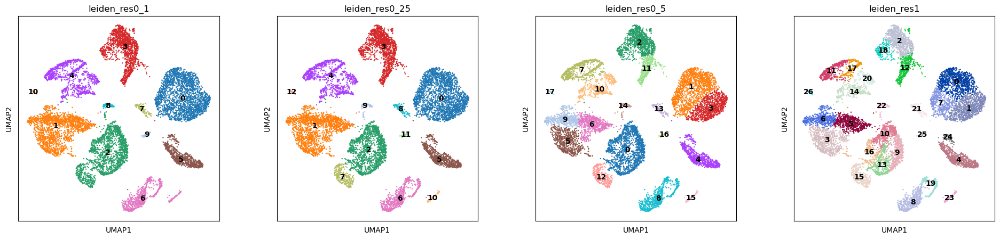

In [6]:
plt.rcParams['figure.figsize'] = (5, 5)
sc.pl.umap(
    xie,
    color=["leiden_res0_1","leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

use resolution 0.5

In [99]:
#xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [3]:
xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## Using marker genes

In [10]:
marker_genes = {
    'Macrophages':['Apoe', 'Mrc1', 'Marco', 'Mertk'], 
    'Monocytes': ['Cd14', 'Vcan'], 
    'T-Cells': ['Cd3e', 'Cd4','Cd8a', 'Cd3d'],
    'B-Cells':['Cd19', 'Cd79a', 'Ms4a1'],
    'AT2':['Muc1', 'Sftpc', 'Sftpd', 'Lcn2', "Cxcl15"],
    'AT1': ['Vegfa',"Ager", "Pdpn"], 
    'Krt8': ['Krt8'],
    'Endothelial': ['Pecam1', "Ly6c1"],
    'Fibroblasts': ['Col1a2'],
    "Myofibroblasts": ["Cthrc1", "Spp1", "Pdgfra", 
                       "Acta2", "Myh11", "Tagln", "Hhip"]    # xie paper uses also these 3
}

In [32]:
marker_genes_hcla = {
    'Alveolar Macrophages':["Fabp4","Apoe","Msr1","Serping1","Mcemp1","Trem1","Gpnmb","Cyp27a1","Pparg","Nupr1"], 
    "Interstitial macrophages":["F13a1","Rnase1","Stab1","Rnase6","Gpr183","Fgl2","Csf1r","Fcgr2b","Il13ra1","Metrnl"],
    'Monocytes': ["Vcan","Cfp","Ereg","Cd300e","Fgl2"], # classical
    'T-Cells': ['Cd3e', 'Cd4','Cd8a', 'Cd3d'], # cd4 + cd 8
    'B-Cells':['Cd19', 'Ms4a1',"Bank1","Ltb","Mef2c","Birc3","Limd2","Gpr183"], 
    'AT2':['Muc1', 'Sftpc', 'Sftpd', 'Lcn2', "Cxcl15", "Sftpb", "Sfta2", "Lamp3", "Lrrk2", "Tfpi", "Mfsd2a"], # Sftpb        SFTPC        SFTPA1        SFTPA2        SFTA2        LAMP3        LRRK2        TFPI        MFSD2A        SERPINA1
    'AT1': ['Vegfa',"Ager", "Pdpn", "Ager", "Cav1","Myl9","Sfta2", "Clic3", "Spock2", "Anxa3","Rtkn2", "Timp3", "Tnnc1"], # Ager    Cav1   Myl9        SFTA2        CliC3        Spock2        Anxa3        Rtkn2        Timp3        Tnnc1
    'Endothelial': ['Pecam1', "Ly6c1"], # old 
    'Fibroblasts': ['Col1a2'], # old 
    "Myofibroblasts": ["Aspn","Bche","Itgbl1","Myh11"],
    "NK-cells": ["Nkg7","Gzmb","Prf1","Cst7","Klrd1","Ctsw","Cd7","Gzma","Cd247"]
}

In [8]:
from matplotlib import colors
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,1))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Macrophages


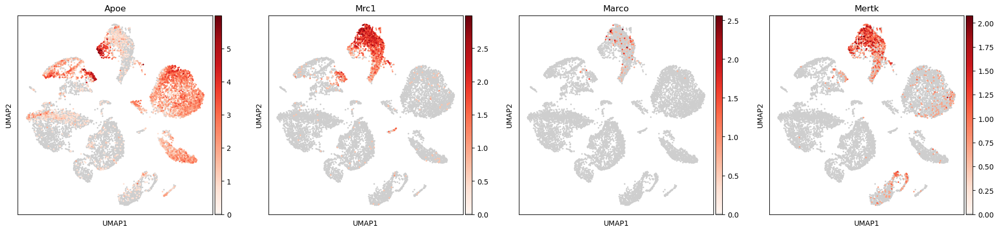

Monocytes


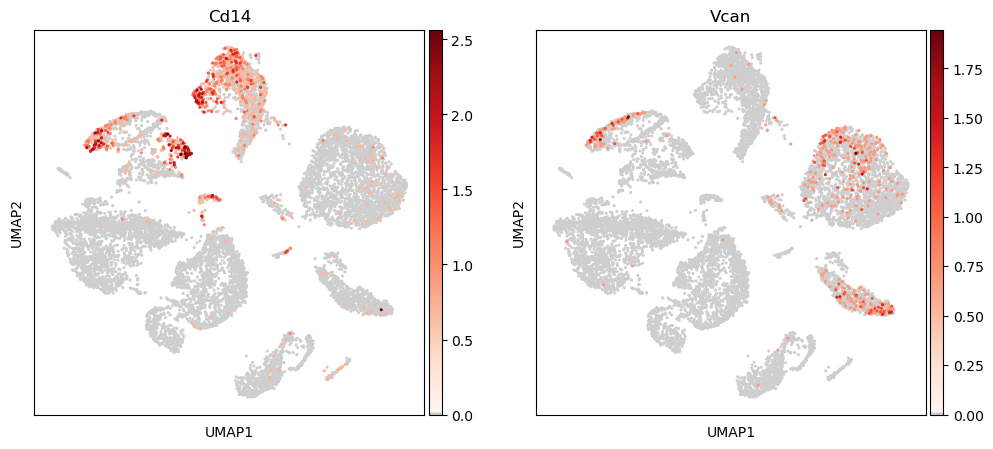

T-Cells


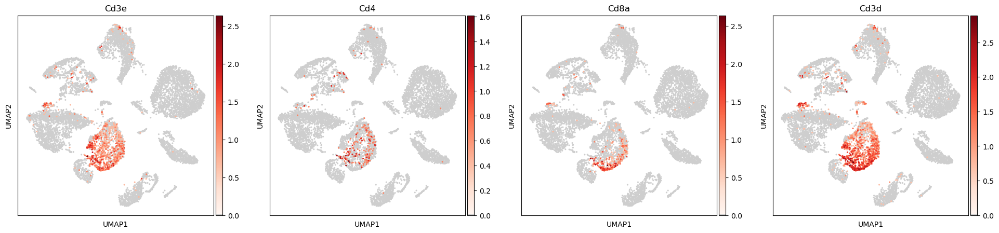

B-Cells


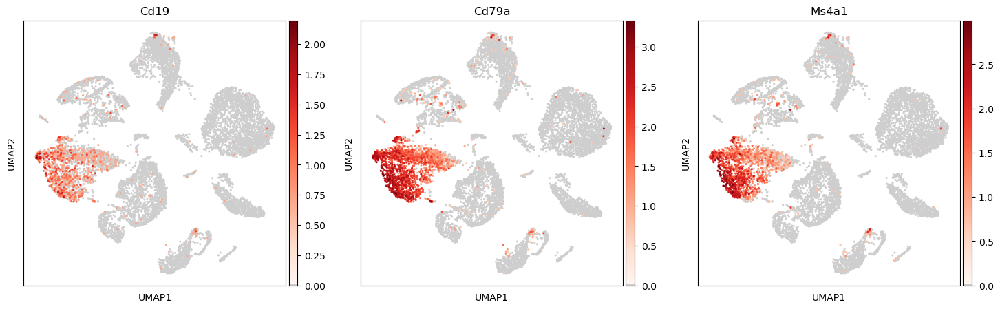

AT2


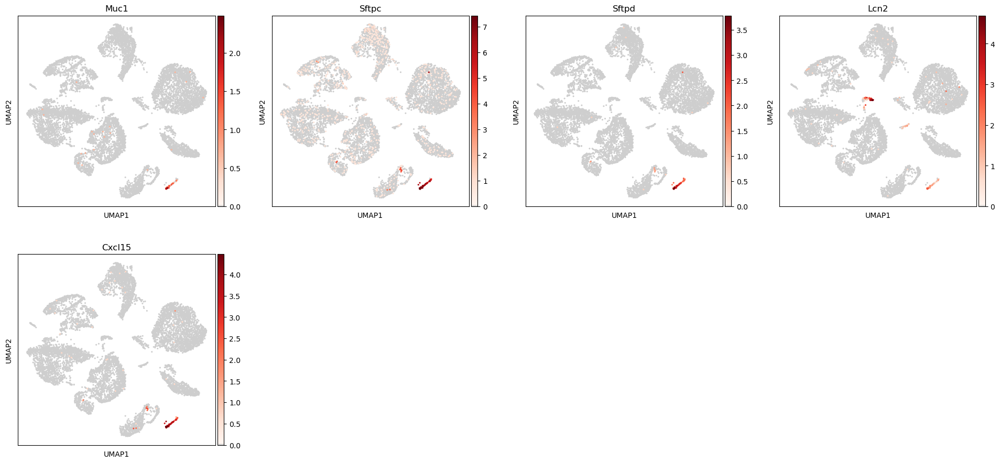

AT1


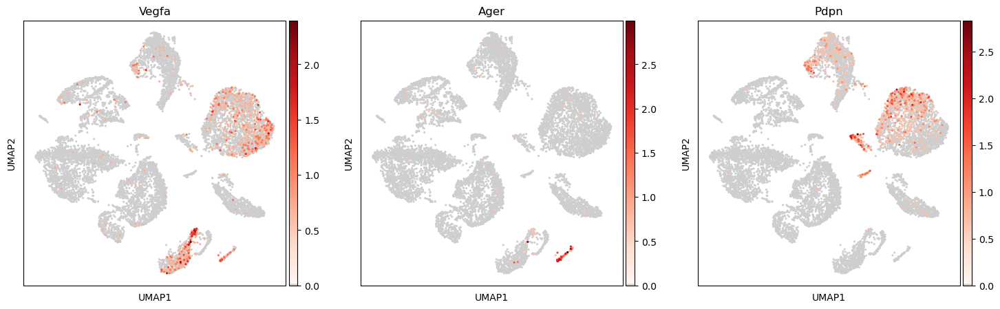

Krt8


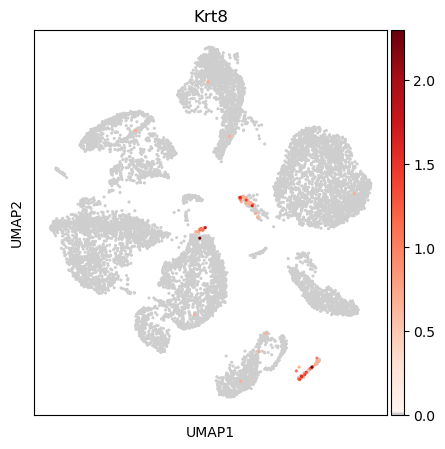

Endothelial


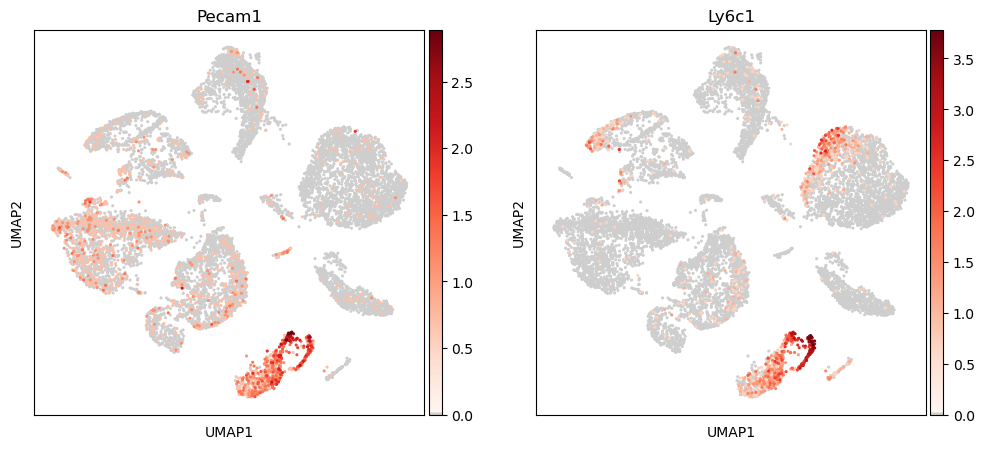

Fibroblasts


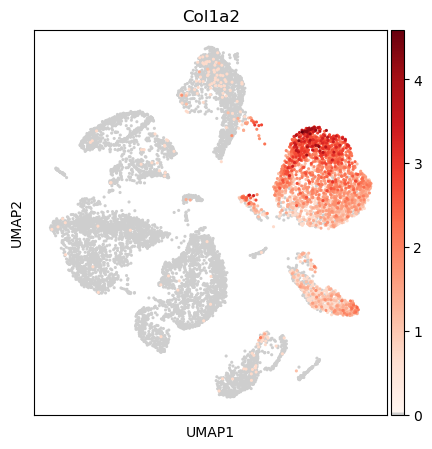

Myofibroblasts


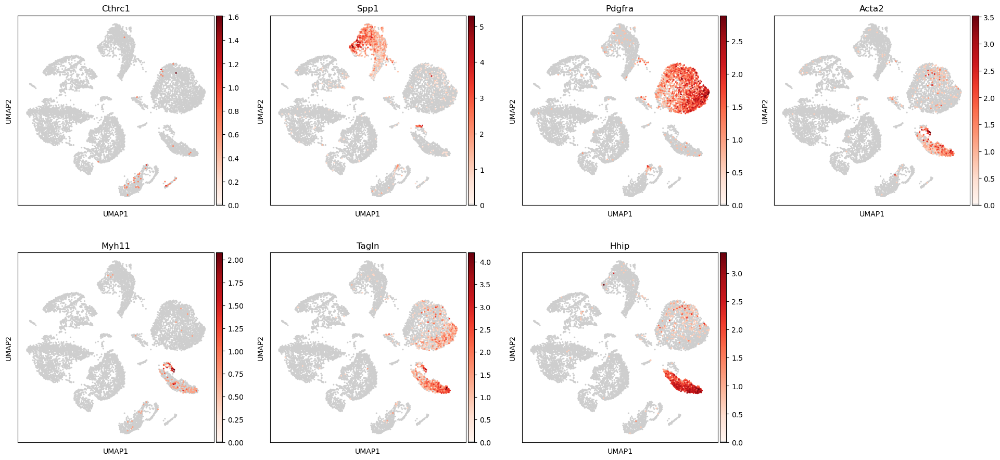

In [33]:
for cell_type in marker_genes.keys():
    print(cell_type)
    sc.pl.umap(xie, color=marker_genes[cell_type], cmap=mymap, size=20)

Alveolar Macrophages


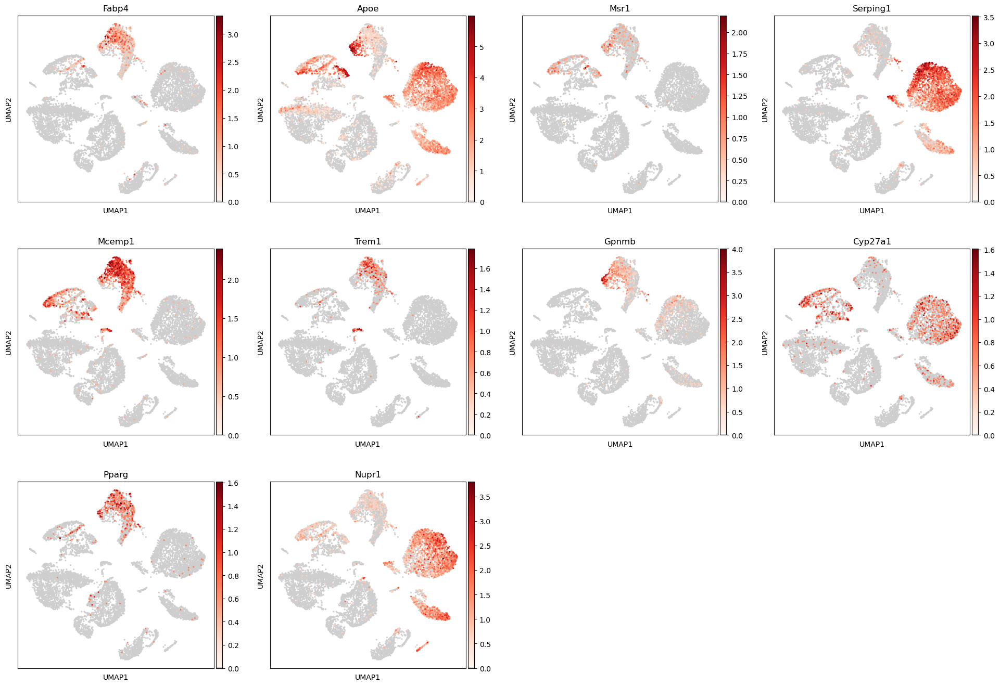

Interstitial macrophages


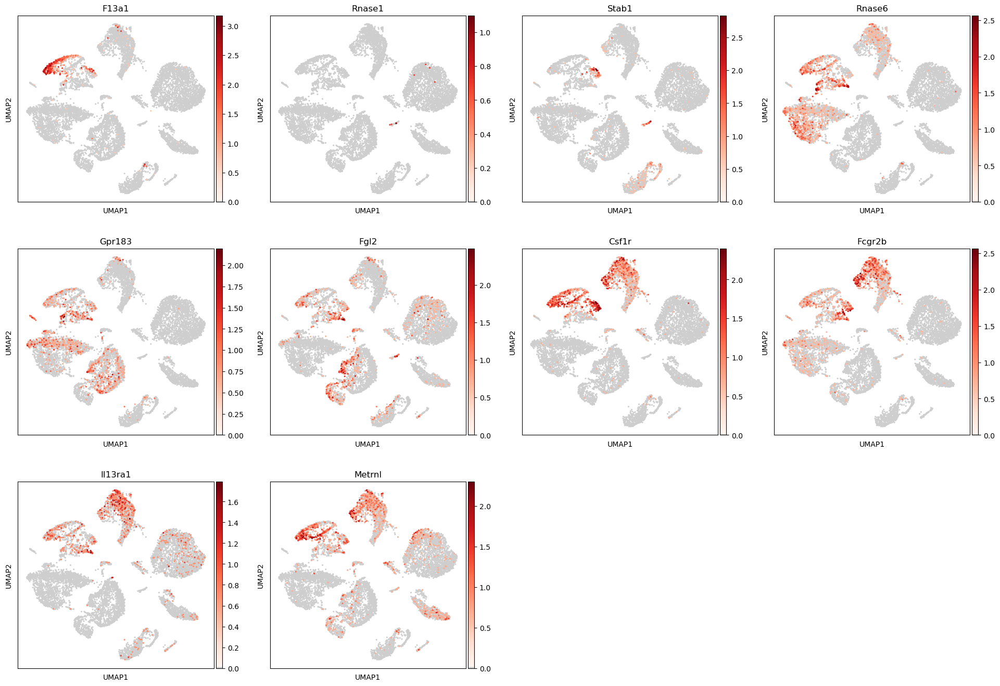

Monocytes


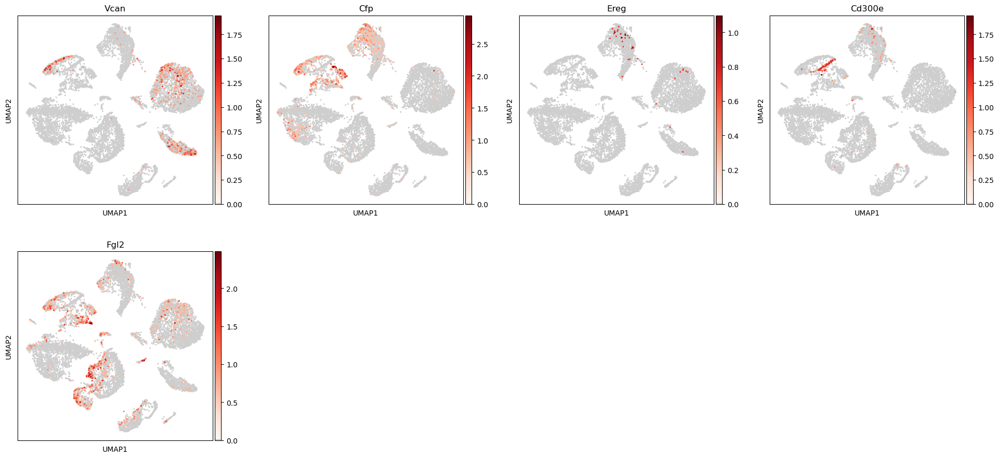

T-Cells


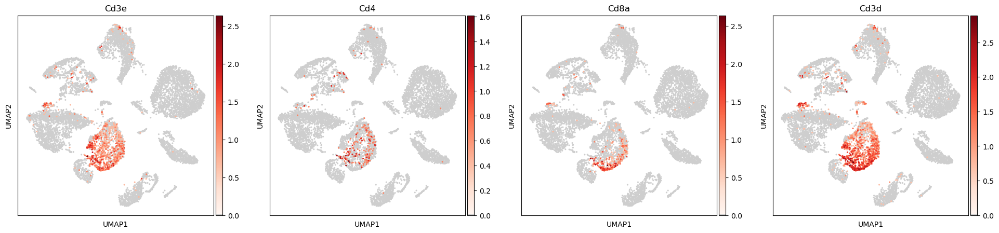

B-Cells


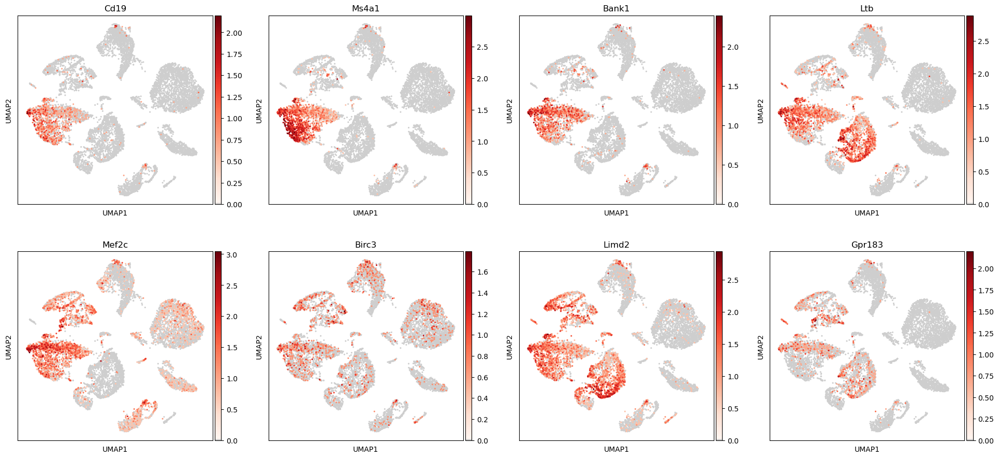

AT2


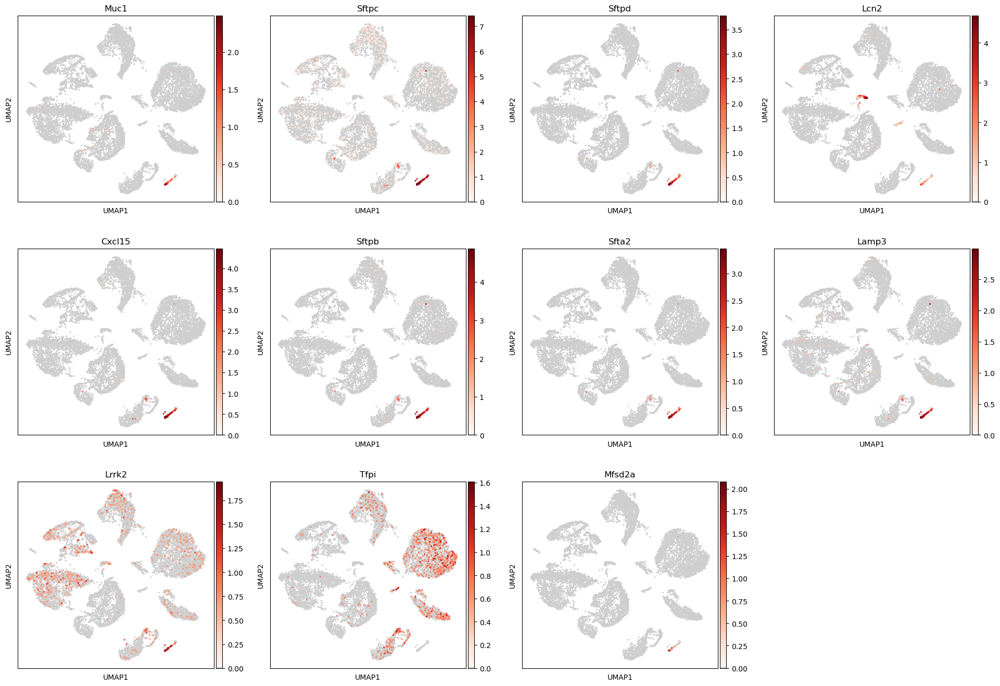

AT1


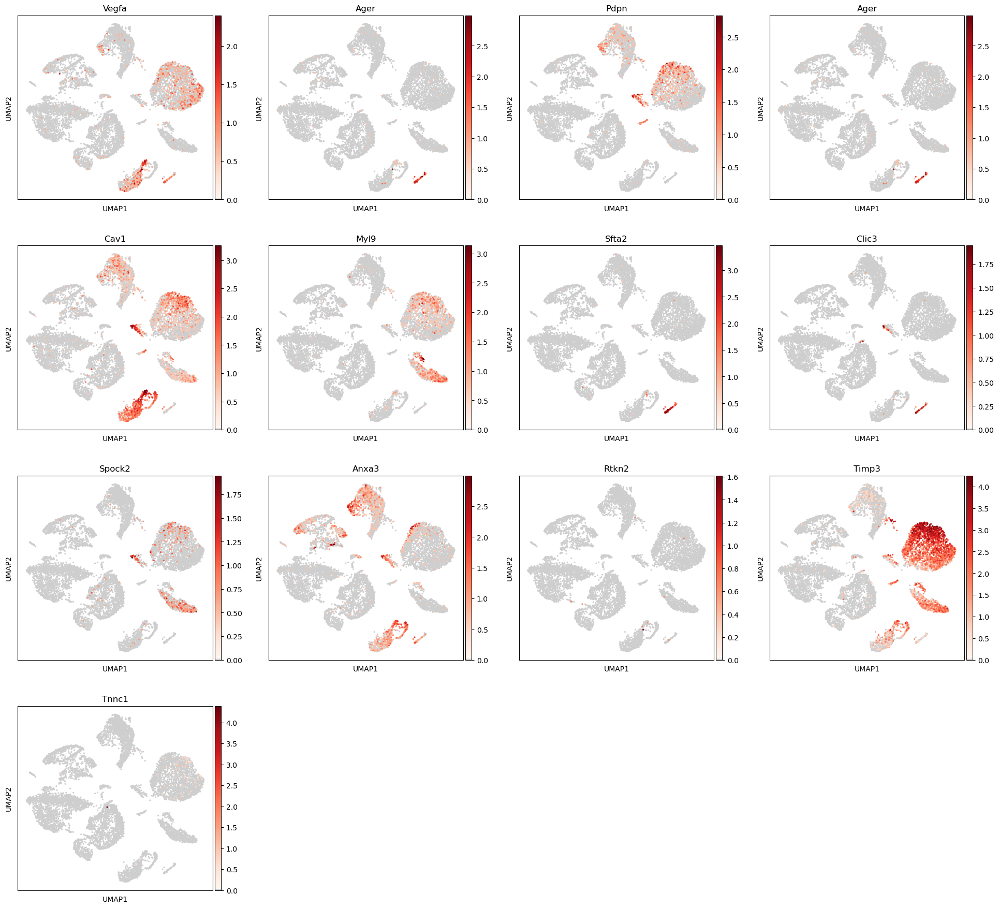

Endothelial


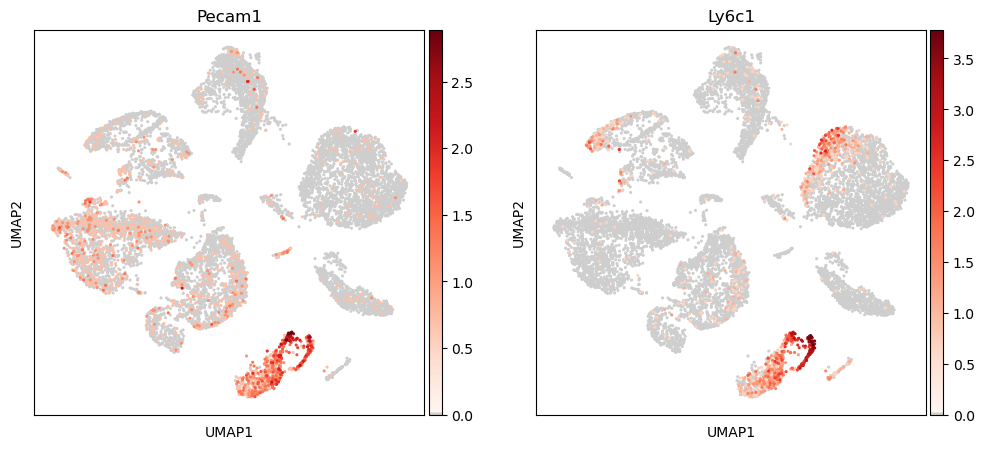

Fibroblasts


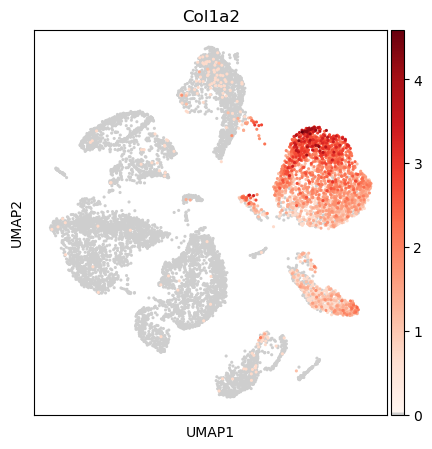

Myofibroblasts


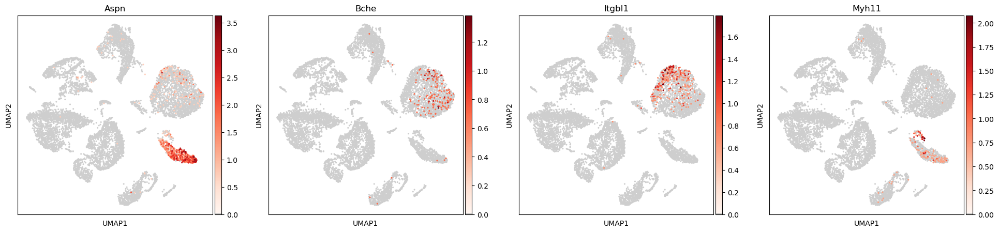

NK-cells


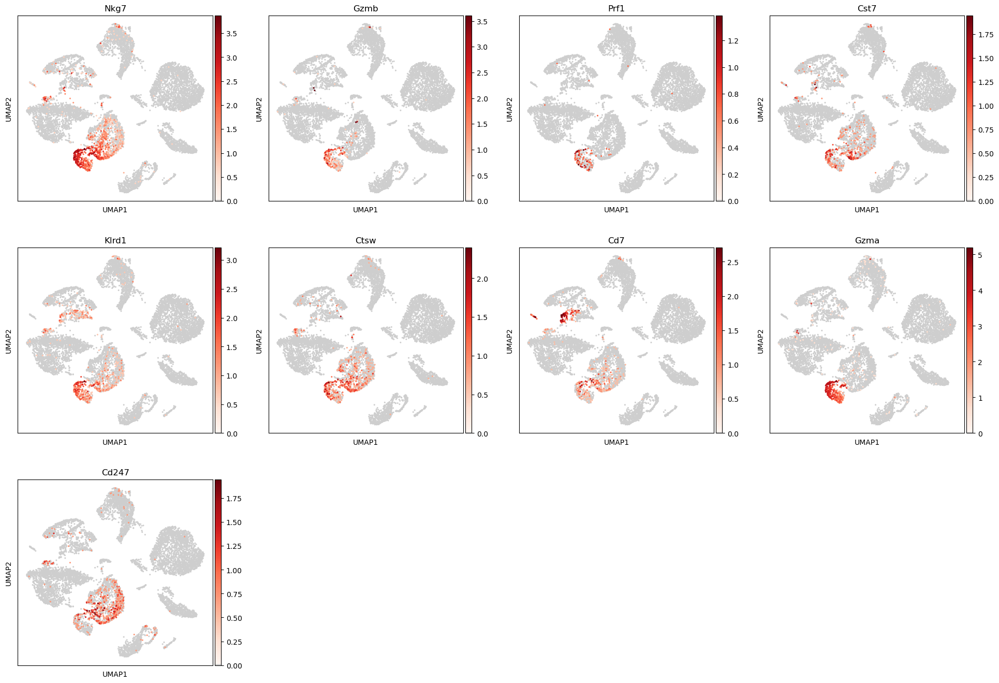

In [34]:
for cell_type in marker_genes_hcla.keys():
    print(cell_type)
    sc.pl.umap(xie, color=marker_genes_hcla[cell_type], cmap=mymap, size=20)

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


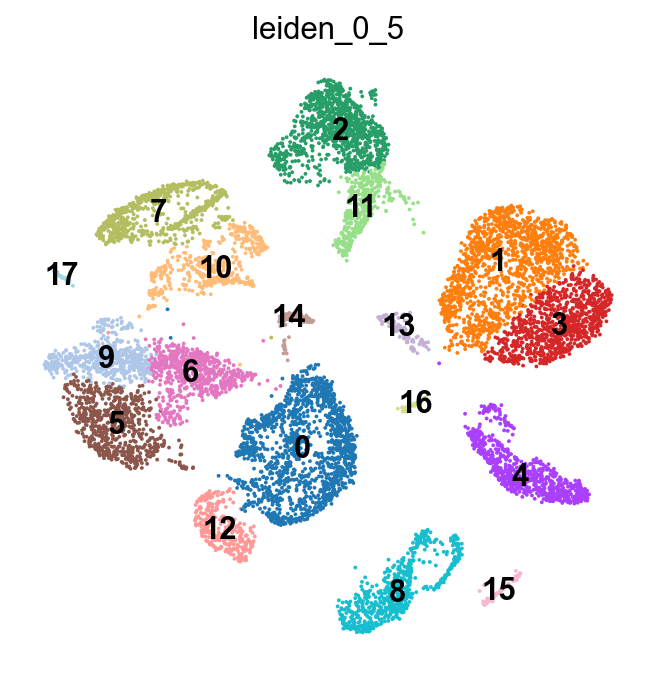

In [106]:
sc.tl.leiden(xie, resolution=0.5, key_added="leiden_0_5")

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


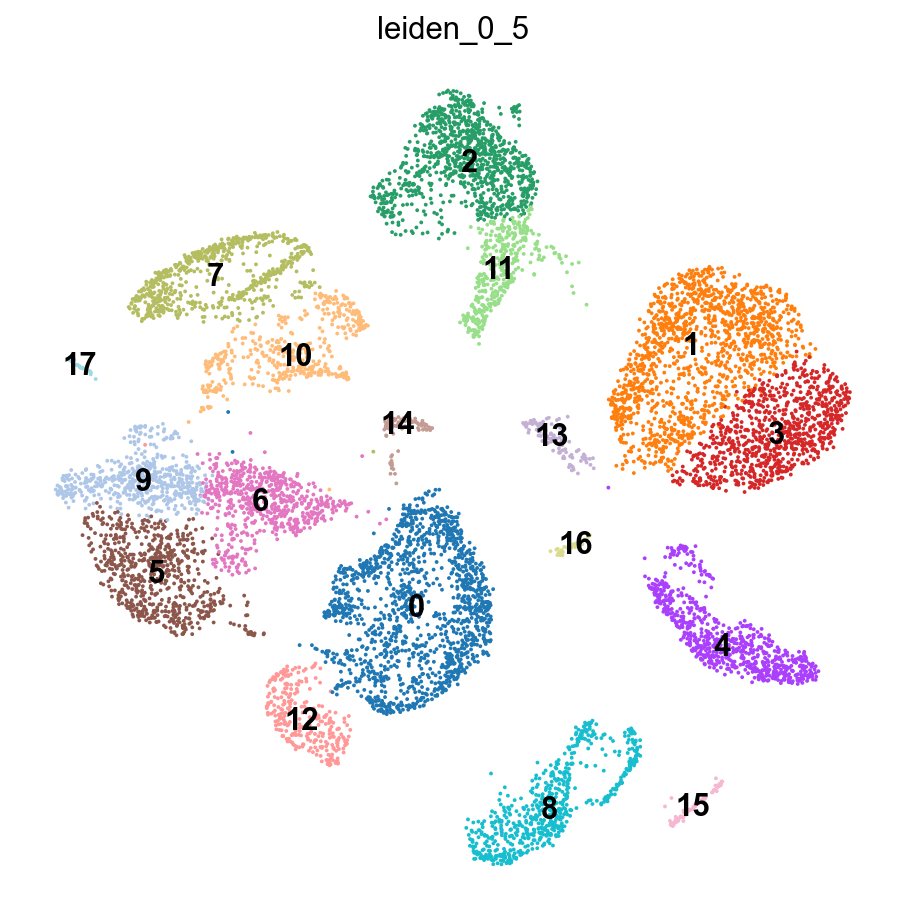

In [107]:
plt.rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(xie, color="leiden_0_5", legend_loc="on data")

In [135]:
cl_anno = {
    "2": "T-Cells", # Mpeg1 --> macrophage b-cell,cybb --> Monocytes, Macrophges
    "3": "Fibroblasts",  # Fibroblasts
    "4": "Myofibroblast", # Myofibroblast?
    "5": "B-Cells", # cd79a + cd79b + Ly6D + ms4a1--> b cell, 
    "6": "B-Cells", # cd79a + cd79b + ms4a1--> b cell, Ly6D -> b cell, t cell --> cluster 5 and 6 together?
    "7": "Macrophages, NK-Cells", # alox5ap --> macrophage, nk, t cells, fyb1 + lst1 --> -cells, Macrophages, NK-cells,
    "8": "Endothelial cells", # EPAS1, egfl7 --> Adipocytes, Endothelial cells,
    "9": "B-Cells", #egfl7 --> see 5 + 6
    "10": "Monocytes, Dendritic cells, Endothelial cells", # immunue cells: ly86 -->  B-cells, monocytes, h2-dmb1 --> dendritic cells, mononuclear phagocytes, some endothelial cells, thymic epithelial cells, and B cell, ccr2 --> monocytes, dendritic cells (DCs), endothelial cells, 
    "11": "Alveolar macrophages", # ear1, ear2 --> alveolar macrophages
    "12": "T-Cells, NK-Cells", #nkg7 --> t and b cells, t-cells, CCL5 iB cells, NK cells, klrk1 --> t and nk cells 
    "13": "Fibroblasts, Myoblasts", # Fibroblasts AEBP1, IGFBP5 (Insulin Like Growth Factor Binding Protein 5) is a Protein Coding gene. Diseases associated with IGFBP5 include Pulmonary Fibrosis , myoblasts
    "14": "Monocytes, Macrophages", #  s100a9 --> monocytes, early differentiation stages of macrophages., lst1 --> macropahges 
    "15": "AT2",
    "16": "Endothelial cells", # ccl21a --> t cells, aqp1 --> endothelial????
     "17": "B-Cells" # 
}
# 5,6,9 very similar 

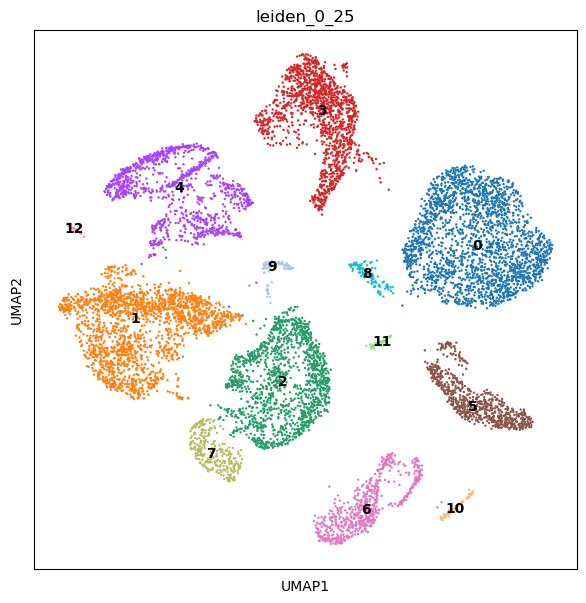

In [36]:
sc.tl.leiden(xie, resolution=0.25, key_added="leiden_0_25")
plt.rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(xie, color="leiden_0_25", legend_loc="on data")

In [119]:
#xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [37]:
cl_anno_coarse = { 
    "0": "Fibroblasts", 
    "1": "B-Cells", # 
    "2": "T-Cells", # 
    "3": "Macrophages",  # 
    "4": "Macrophages", # 
    "5": "Myofibroblast", # 
    "6": "Endothelial", #
    "7": "NK-Cells", #
    "8": "Fibroblasts", # 
    "9": "AT2/Macrophage", # AT2 / macrophage 
    "10": "AT2",
    "11": "NA",
    "12":"B-Cells"
}


In [39]:
xie.obs["manual_celltype_annotation_coarse"] = xie.obs.leiden_0_25.map(cl_anno_coarse).astype("category")

In [47]:

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)
plt.rcParams['figure.figsize'] = (7, 7)

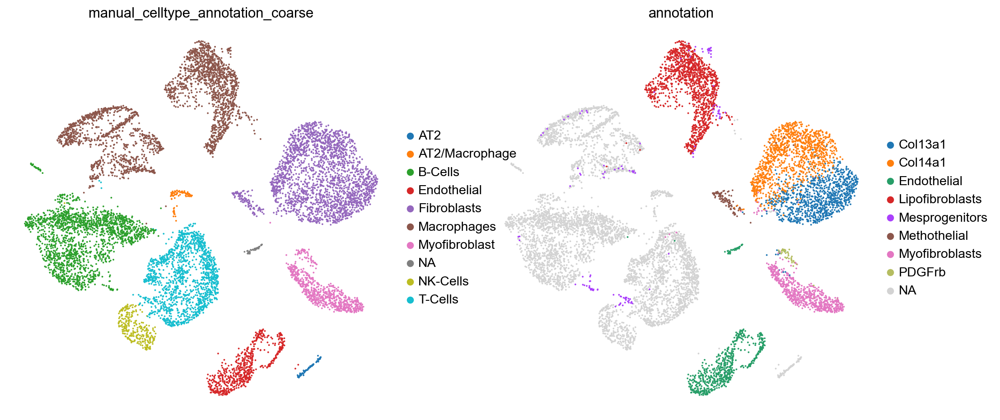

In [52]:
sc.pl.umap(xie, color=["manual_celltype_annotation_coarse", "annotation"])

In [53]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## By rank_genes_groups

In [123]:
sc.tl.rank_genes_groups(
    xie, groupby="leiden_0_5", method="wilcoxon", key_added="dea_leiden_0_5"
)

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


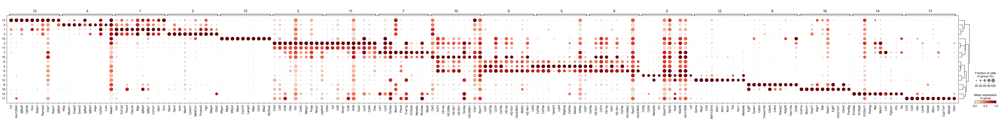

In [124]:
sc.pl.rank_genes_groups_dotplot(
    xie, groupby="leiden_0_5", standard_scale="var", n_genes=10, key="dea_leiden_0_5"
)

In [126]:
sc.tl.filter_rank_genes_groups(
    xie,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_5",
    key_added="dea_leiden_0_5_filtered",
)



/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


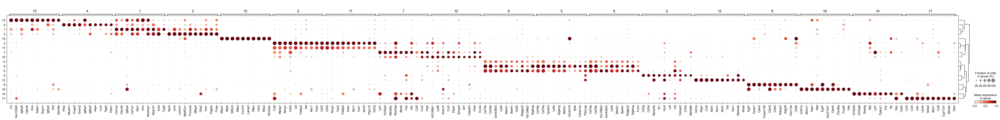

In [131]:
sc.pl.rank_genes_groups_dotplot(
    xie,
    groupby="leiden_res0_5",
    standard_scale="var",
    n_genes=10,
    key="dea_leiden_0_5_filtered",
)


In [144]:
xie.obs["manual_celltype_annotation"] = xie.obs.leiden_0_5.map(cl_anno).astype("category")

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


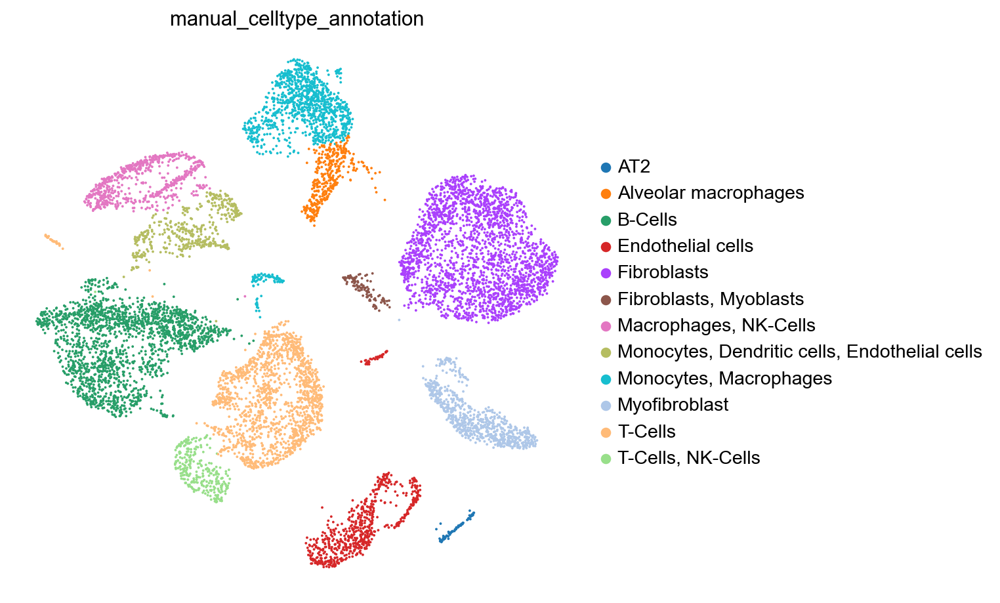

In [137]:
sc.pl.umap(xie, color=["manual_celltype_annotation"])

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


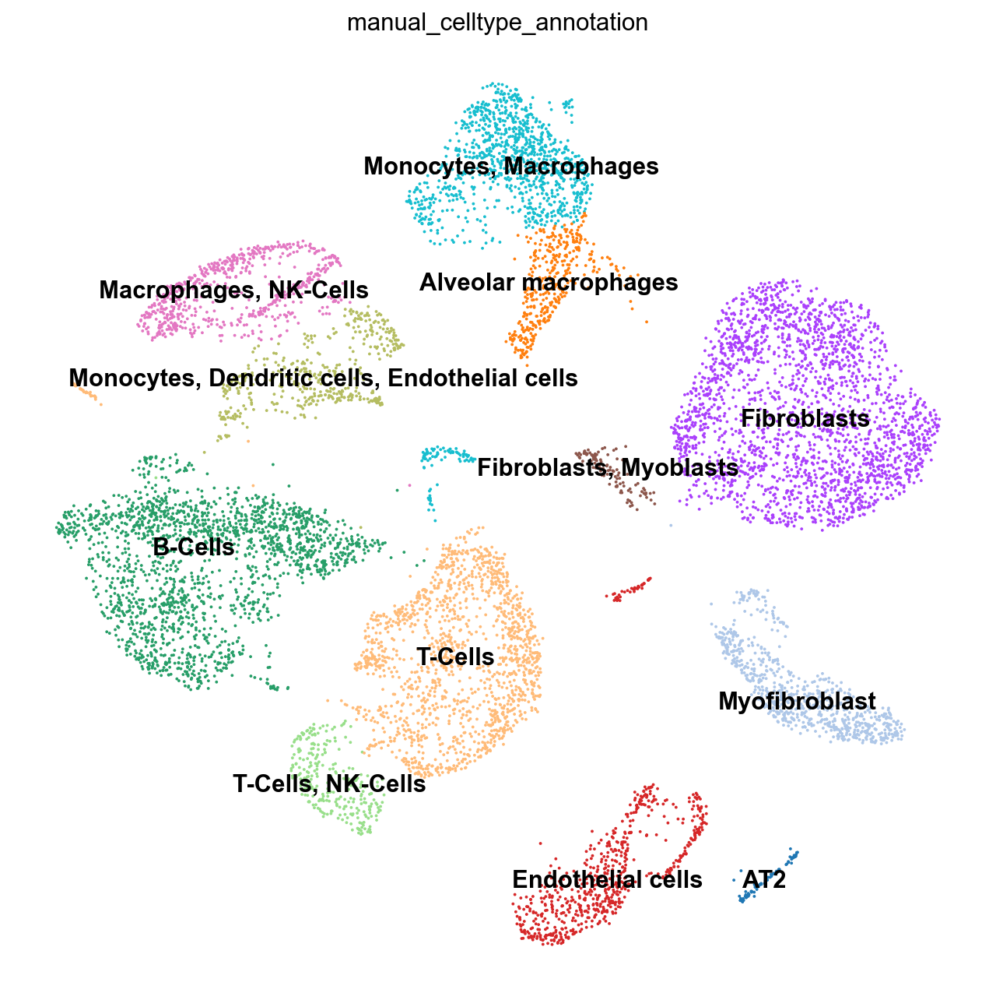

In [139]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=["manual_celltype_annotation"], legend_loc = "on data")

In [ ]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'leiden_res0_1', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'cond', 'leiden_0_5', 'manual_celltype_annotation'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'leiden', 'leiden_res0_1_colors', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'sample

## Celltypist

In [4]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)
import os
from scipy.sparse import csr_matrix
import celltypist
from celltypist import models
import scvi

/mnt/cip/home/p/pohll/mambaforge/envs/xie_env/lib/python3.9/site-packages/scvi/__init__.py:31: DeprecationWarning: scvi is deprecated, please uninstall scvi via `pip uninstall scvi` and install the new scvi-tools package at github.com/YosefLab/scvi-tools
  warnings.warn(deprecation_msg, DeprecationWarning)


In [5]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [ ]:
dir_reference_model = "./scvi_reference_model"
path_annotations = "./cell_type_annotations.csv"

In [108]:
# daniel's xie adata:
xie_processed = sc.read('/home/p/pohll/Desktop/MP/data/xie/processed.h5ad') 
# use (backed="r") if h5ad very big 

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(
/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [117]:
xie_processed.obs.louvain_final.value_counts()

louvain_final
lipofibroblasts                1689
b-cells 1                      1195
t-cells 1                      1131
b-cells2                        751
Am,0                            712
Hpp1 fibroblasts,0              679
monocytes                       679
endothelial                     658
Peribronchiolar fibroblasts     621
Am,1                            560
9                               436
11                              287
Mo-Am                           179
AT2                             132
dendridic cells                 121
interstitial macrophages        114
Adh7+ fibroblasts               102
neutrophils,2                    95
neutrophils,3                    90
14                               44
fibroblasts                      38
myofibroblasts                   24
Name: count, dtype: int64

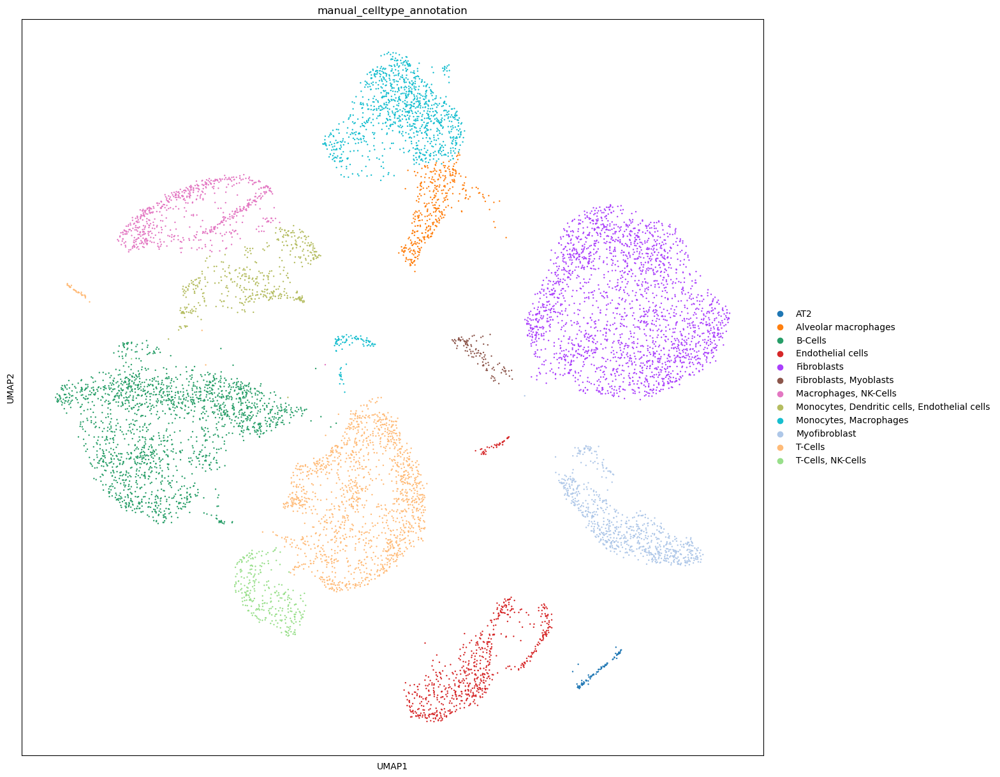

In [4]:
sc.pl.umap(xie, color=["manual_celltype_annotation"])